In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import missingno as msn
import seaborn as sns
import plotly.express as px

# Reading data

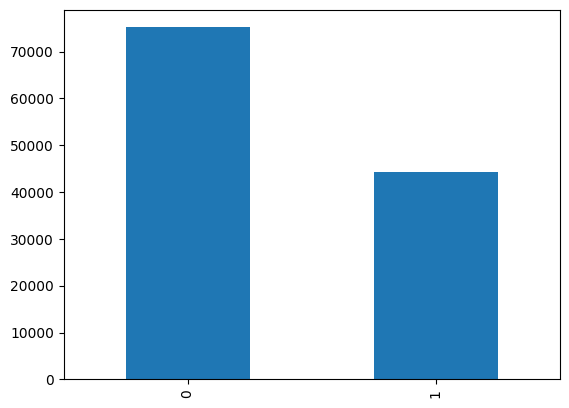

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,304.0,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,240.0,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [3]:
df = pd.read_csv('hotel_bookings.csv')
df.is_canceled.value_counts().plot(kind='bar')
plt.show()
df.head()

C:\Users\richi\AppData\Local\Temp\ipykernel_2708\1450082608.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor = df.corr()


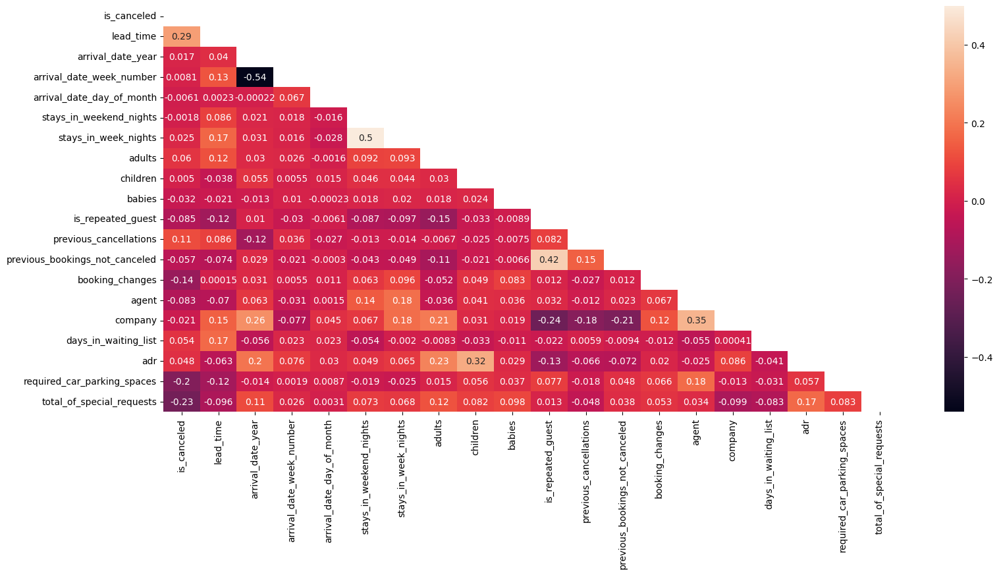

In [4]:
cor = df.corr()
mask = np.zeros_like(cor, dtype=bool)
mask[np.triu_indices_from(mask)] = True
plt.figure(figsize=(18, 8))
sns.heatmap(cor, mask=mask, annot=True)
plt.show()

In [5]:
cor.is_canceled.abs().sort_values(ascending=False)

is_canceled                       1.000000
lead_time                         0.293123
total_of_special_requests         0.234658
required_car_parking_spaces       0.195498
booking_changes                   0.144381
previous_cancellations            0.110133
is_repeated_guest                 0.084793
agent                             0.083114
adults                            0.060017
previous_bookings_not_canceled    0.057358
days_in_waiting_list              0.054186
adr                               0.047557
babies                            0.032491
stays_in_week_nights              0.024765
company                           0.020642
arrival_date_year                 0.016660
arrival_date_week_number          0.008148
arrival_date_day_of_month         0.006130
children                          0.005048
stays_in_weekend_nights           0.001791
Name: is_canceled, dtype: float64

In [6]:
fig = px.imshow(cor, width=700, height=700)
fig.show()

# Data cleaning and managing missing values

In [7]:
df.loc[df.agent.isnull() == False, 'agent'] = 'Agent'
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,NaN,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,NaN,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,Agent,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,Agent,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


In [8]:
df.agent.fillna('No_Agent', inplace=True)

In [9]:
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,No Deposit,No_Agent,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,No Deposit,No_Agent,NaN,0,Transient,0.0,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,No Deposit,No_Agent,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,No Deposit,Agent,NaN,0,Transient,75.0,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,No Deposit,Agent,NaN,0,Transient,98.0,0,1,Check-Out,2015-07-03


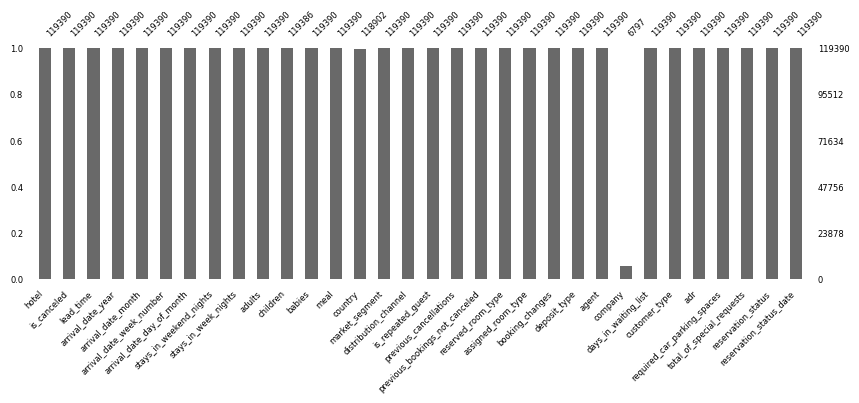

children         4
country        488
company     112593
dtype: int64

In [10]:
NaN = df.isnull().sum()[df.isnull().sum() > 0]
msn.bar(df, figsize=(10, 3), fontsize=6)
plt.show()
NaN


In [11]:
df.country.fillna('unknown', inplace=True)

In [12]:
df.children.fillna(0, inplace=True)

In [13]:
df.isnull().sum()[df.isnull().sum()>0]

company    112593
dtype: int64

In [14]:
df.loc[(df.market_segment == 'Corporate') | (df.distribution_channel == 'Corporate') & (df.company.isnull() == True), 'company'] = 'Corporate'

In [15]:
df.company.fillna('Individuals', inplace=True)

In [16]:
df.loc[(df.company.isnull() == False) & (
    df.company != 'Individuals'), 'company'] = 'Corporate'

In [17]:
df.company.value_counts()

Individuals    110912
Corporate        8478
Name: company, dtype: int64

Series([], dtype: int64)

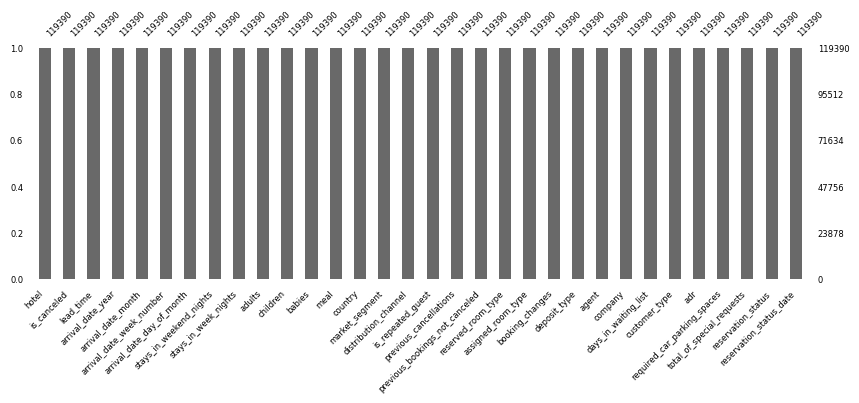

In [18]:
msn.bar(df, figsize=(10,3), fontsize=6)
plt.show
df.isnull().sum()[df.isnull().sum()>0]

In [19]:
df = df.drop_duplicates(keep='first').reset_index().drop('index', axis=1)

In [20]:
df.arrival_date_year = df.arrival_date_year.astype(object)

Bin countries

In [21]:
df.country.unique()

array(['PRT', 'GBR', 'USA', 'ESP', 'IRL', 'FRA', 'unknown', 'ROU', 'NOR',
       'OMN', 'ARG', 'POL', 'DEU', 'BEL', 'CHE', 'CN', 'GRC', 'ITA',
       'NLD', 'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN',
       'MOZ', 'BWA', 'LUX', 'SVN', 'ALB', 'IND', 'CHN', 'MEX', 'MAR',
       'UKR', 'SMR', 'LVA', 'PRI', 'SRB', 'CHL', 'AUT', 'BLR', 'LTU',
       'TUR', 'ZAF', 'AGO', 'ISR', 'CYM', 'ZMB', 'CPV', 'ZWE', 'DZA',
       'KOR', 'CRI', 'HUN', 'ARE', 'TUN', 'JAM', 'HRV', 'HKG', 'IRN',
       'GEO', 'AND', 'GIB', 'URY', 'JEY', 'CAF', 'CYP', 'COL', 'GGY',
       'KWT', 'NGA', 'MDV', 'VEN', 'SVK', 'FJI', 'KAZ', 'PAK', 'IDN',
       'LBN', 'PHL', 'SEN', 'SYC', 'AZE', 'BHR', 'NZL', 'THA', 'DOM',
       'MKD', 'MYS', 'ARM', 'JPN', 'LKA', 'CUB', 'CMR', 'BIH', 'MUS',
       'COM', 'SUR', 'UGA', 'BGR', 'CIV', 'JOR', 'SYR', 'SGP', 'BDI',
       'SAU', 'VNM', 'PLW', 'QAT', 'EGY', 'PER', 'MLT', 'MWI', 'ECU',
       'MDG', 'ISL', 'UZB', 'NPL', 'BHS', 'MAC', 'TGO', 'TWN', 'DJI',
       'STP', 'KN

In [22]:
eu = ['PRT', 'GBR', 'ESP', 'IRL', 'FRA', 'ROU', 'NOR', 'POL', 'DEU', 'BEL', 'CHE', 'GRC', 'ITA',
       'NLD', 'DNK', 'RUS', 'SWE', 'AUS', 'EST', 'CZE', 'BRA', 'FIN', 'LUX', 'SVN', 'ALB', 'UKR', 'SMR', 'LVA', 'SRB', 'AUT', 'BLR', 'LTU','TUR','HUN','HRV','GEO','AND','SVK',
       'MKD','BIH','BGR','MLT','ISL','MCO','LIE','MNE']
n_am = ['USA','MEX','PRI','CRI','CUB','HND','NIC','GAB','PAN','SLV','GTM']
s_am = ['ARG', 'BRA', 'CHL', 'URY', 'COL', 'VEN',
        'SUR', 'PER', 'ECU', 'BOL', 'PRY', 'GUY']
asia = ['OMN', 'CN', 'IND', 'CHN', 'ISR', 'KOR', 'ARE', 'HKG', 'IRN', 'CYP', 'KWT', 'MDV', 'KAZ', 'PAK', 'IDN', 'LBN', 'PHL', 'AZE', 'BHR',
        'THA', 'MYS', 'ARM', 'JPN', 'LKA', 'JOR', 'SYR', 'SGP', 'SAU', 'VNM', 'QAT', 'UZB', 'NPL', 'MAC', 'TWN', 'IRQ', 'KHM', 'BGD', 'TJK',
        'TMP', 'MMR', 'LAO']
africa = ['MOZ', 'BWA', 'MAR', 'ZAF', 'AGO', 'ZMB', 'ZWE', 'DZA', 'TUN', 'CAF', 'NGA', 'SEN', 'SYC', 'CMR', 'MUS', 'COM', 'UGA', 'CIV',
          'BDI', 'EGY', 'MWI', 'MDG', 'TGO', 'DJI', 'STP', 'ETH', 'RWA', 'BEN', 'TZA', 'GHA', 'KEN', 'GNB', 'BFA', 'LBY', 'MLI', 'NAM',
          'MRT', 'SDN', 'SLE']

australia = ['AUS']
other = ['CYM', 'CPV', 'JAM', 'GIB', 'JEY', 'GGY', 'FJI', 'NZL', 'DOM', 'PLW', 'BHS', 'KNA', 'IMN', 'VGB', 'GLP', 'UMI', 'MYT', 'FRO',
          'BRB', 'ABW', 'AIA', 'DMA', 'PYF', 'LCA', 'ATA', 'ASM', 'NCL', 'KIR', 'ATF']
unkw = ['unknown']


In [23]:
def bin_country(x):
    if x in eu:
        return 'eu'
    elif x in n_am:
        return 'n_am'
    elif x in s_am:
        return 's_am'
    elif x in asia:
        return 'asia'
    elif x in africa:
        return 'africa'
    elif x in australia:
        return 'australia'
    elif x in other:
        return 'other'
    elif x in unkw:
        return 'unknown'

In [24]:
df.country = df.country.apply(bin_country)

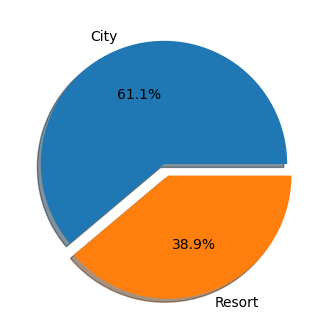

In [25]:
plt.figure(figsize=(4,4))
plt.pie(df.hotel.value_counts(), labels=['City', 'Resort'], autopct='%1.1f%%', explode=(0, 0.1), shadow=True)
plt.show()

### Variable Hotel over cancellation

<Figure size 300x300 with 0 Axes>

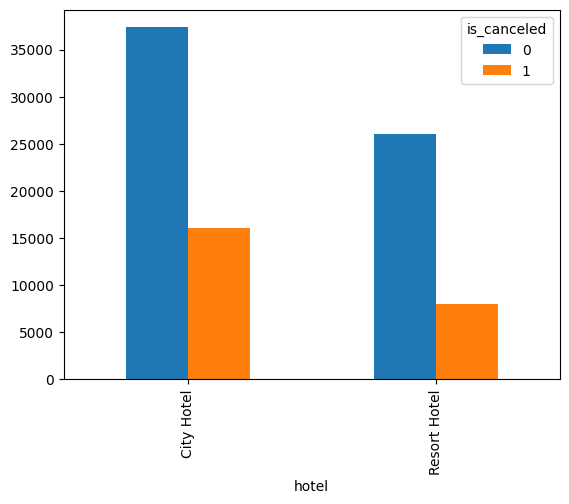

In [26]:
plt.figure(figsize=(3,3))
pd.crosstab(df.hotel, df.is_canceled).plot(kind='bar')
plt.show()

In [27]:
ct = pd.crosstab(df.hotel, df.is_canceled, margins=True)
ct['cancel_%'] = (ct[1]/ct['All'])*100

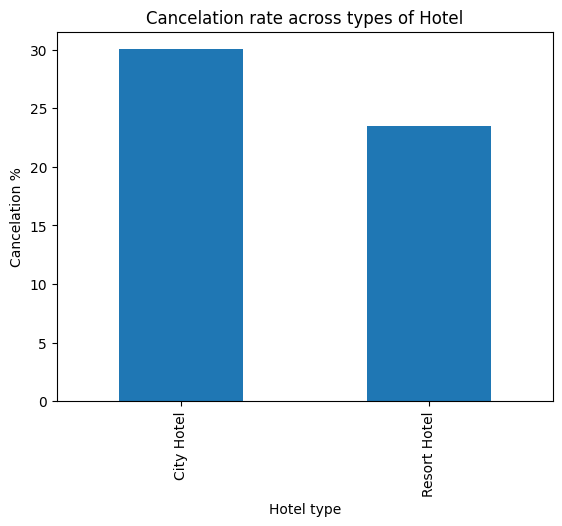

In [28]:
ct.drop('All', axis=0)['cancel_%'].plot(kind='bar')
plt.title('Cancelation rate across types of Hotel')
plt.xlabel('Hotel type')
plt.ylabel('Cancelation %')
plt.show()

### Variable lead_time over cancellation

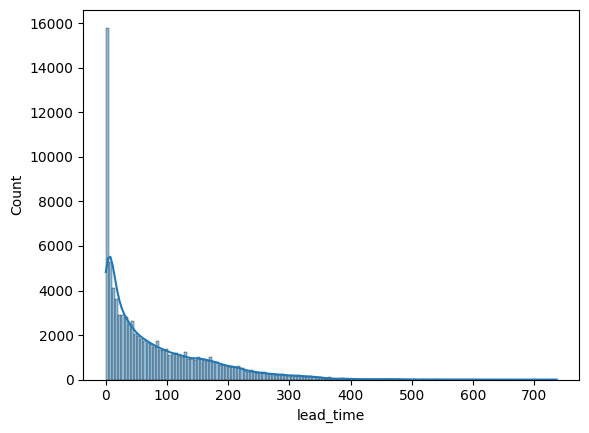

In [29]:
sns.histplot(df.lead_time, kde=True)
plt.show()

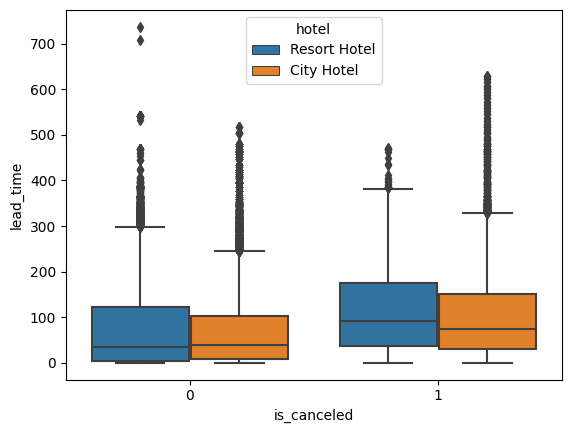

In [30]:
sns.boxplot(df, x='is_canceled', y='lead_time', hue='hotel')
plt.show()

### Variable arrival_date_year over cancellation

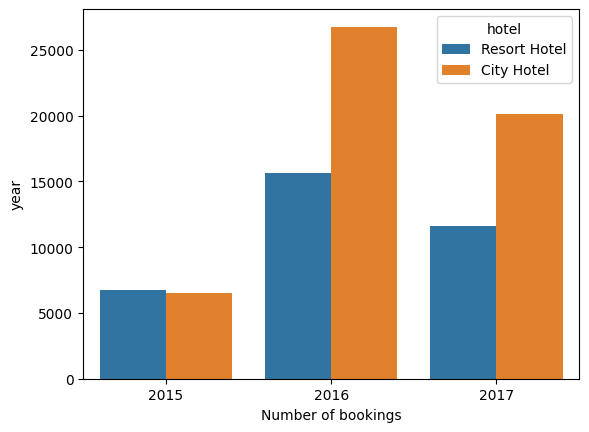

In [31]:
sns.countplot(df, x='arrival_date_year', hue='hotel')
plt.xlabel('Number of bookings')
plt.ylabel('year')
plt.show()

In [32]:
ct = pd.crosstab(df.arrival_date_year, df.is_canceled, margins=True)
ct['cancel_%'] = (ct[1]/ct.All)*100
ct.drop('All', axis=0, inplace=True)

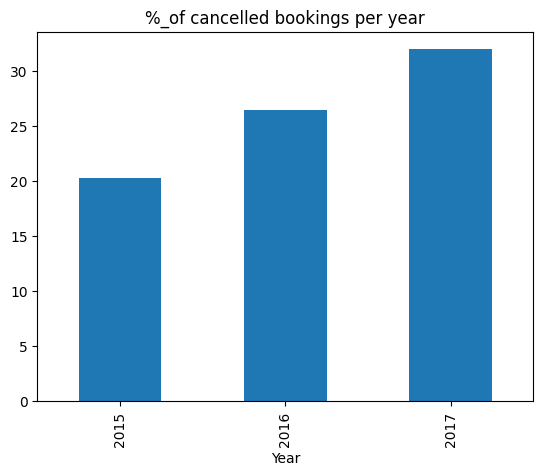

In [33]:
ct['cancel_%'].plot(kind='bar')
plt.xlabel('Year')
plt.title('%_of cancelled bookings per year')
plt.show()

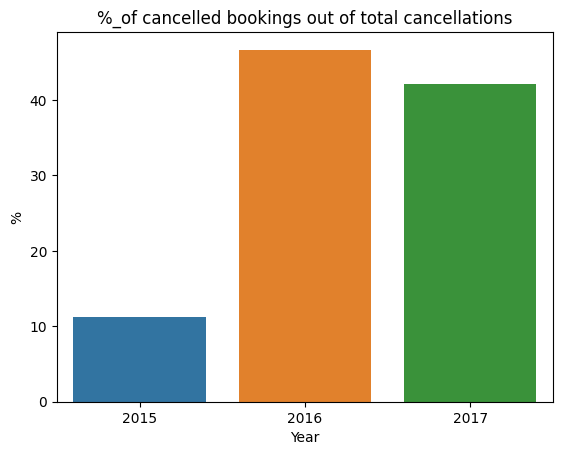

In [34]:
a = pd.DataFrame(df[df.is_canceled==1].arrival_date_year.value_counts()/(df[df.is_canceled==1].arrival_date_year.value_counts().sum())*100).reset_index()
a.columns=['year', '%']
sns.barplot(a, x='year', y='%')
plt.xlabel('Year')
plt.title('%_of cancelled bookings out of total cancellations')
plt.show()

### Variable arrival_date_month over cancellation

In [35]:
index=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
month = pd.DataFrame(df.groupby(df.arrival_date_month).is_canceled.count(), index=index).reset_index()
month.columns = ['Month', 'tot_canceled']

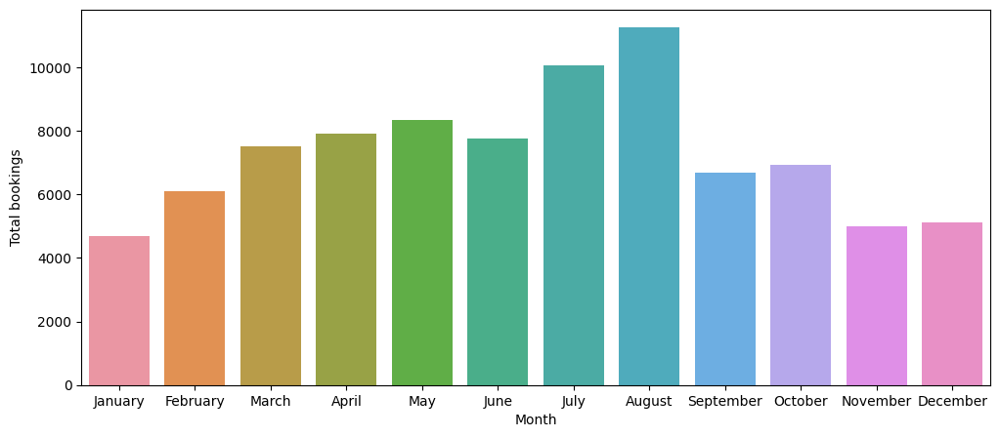

In [36]:
plt.figure(figsize=(12,5))
sns.barplot(month, x='Month', y='tot_canceled')
plt.ylabel('Total bookings')
plt.show()

In [37]:
#Data merge ordered month bookings fro Resort and City
city_book = pd.DataFrame(df[df.hotel=='City Hotel'].groupby('arrival_date_month').is_canceled.count(), index=index).reset_index()
resort_book = pd.DataFrame(df[df.hotel == 'Resort Hotel'].groupby('arrival_date_month').is_canceled.count(), index=index).reset_index()
city_book
books_merge = city_book.merge(resort_book, on='index')
books_merge.columns=['Month', 'city_books', 'resort_books']

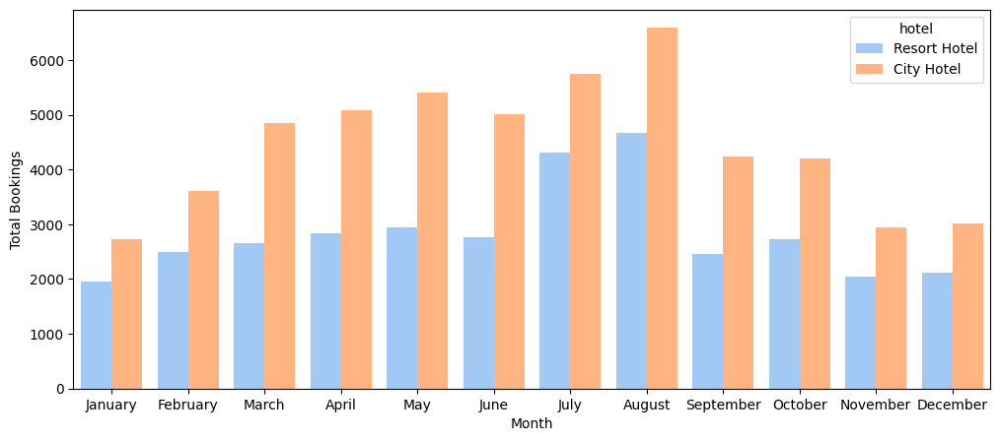

In [38]:
plt.figure(figsize=(12,5))
sns.countplot(df, x='arrival_date_month', order=index, hue='hotel', palette='pastel', saturation=1)
plt.xlabel('Month')
plt.ylabel('Total Bookings')
plt.show()

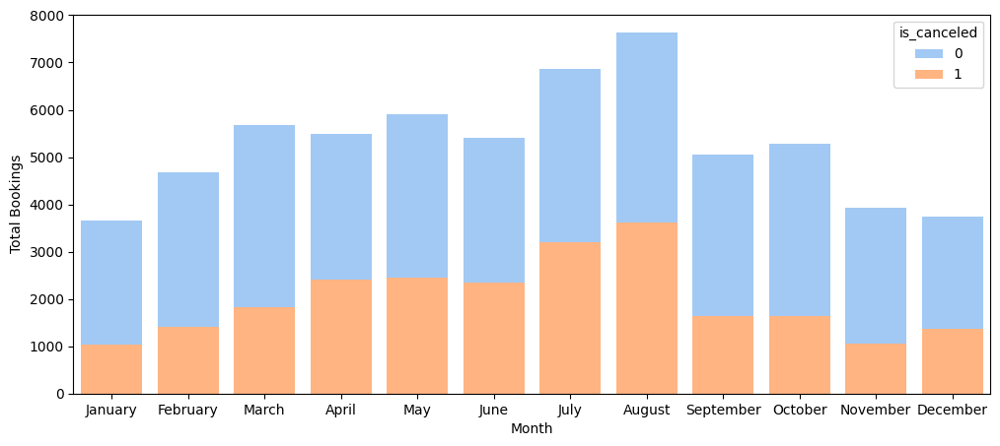

In [39]:
plt.figure(figsize=(12, 5))
sns.countplot(df, x='arrival_date_month', order=index,
              hue='is_canceled', dodge=False, palette='pastel', saturation=1)
plt.xlabel('Month')
plt.ylabel('Total Bookings')
plt.show()


### Variable arrival_date_week_number over cancellation

In [40]:
px.line(df.groupby('arrival_date_week_number').is_canceled.count(
).reset_index(), x='arrival_date_week_number', y='is_canceled', labels={'arrival_date_week_number': 'arrival date week number', 'is_canceled':'bookings'})

In [41]:
pd.Series({'Mean:': df.arrival_date_week_number.mean(),
          'Median:': df.arrival_date_week_number.median(), 'Mode:': df.arrival_date_week_number.mode()[0], 'Skew:':df.arrival_date_week_number.skew()})

Mean:      26.837776
Median:    27.000000
Mode:      33.000000
Skew:       0.022556
dtype: float64

### Variable arrival_date_day_of_month over cancellation

In [42]:
a = df.groupby('arrival_date_day_of_month').is_canceled.count().reset_index()
fig = px.line(a, x='arrival_date_day_of_month', y='is_canceled',
              labels={'arrival_date_day_of_month': 'arrival date day of month', 'is_canceled': 'total bookings'})
fig.show()

### Variable stays_in_weekend_nights over cancellation

In [43]:
px.bar(df.groupby(['stays_in_weekend_nights', 'hotel']).is_canceled.count().reset_index(),
       x='stays_in_weekend_nights', y='is_canceled', barmode='group', template='plotly_dark', width=800, height=400, color='hotel', labels={'stays_in_weekend_nights':'stays in weekend nights', 'is_canceled':'Bookings'})

In [44]:
px.box(df, x='is_canceled', y='stays_in_weekend_nights', color='hotel', labels={
       'stays_in_weekend_nights': 'stays in weekend nights', 'is_canceled': 'Cancelled'}, width=800, height=400, template='plotly_dark')

In [45]:
px.violin(df, x='is_canceled', y='stays_in_weekend_nights', color='hotel', labels={
       'stays_in_weekend_nights': 'stays in weekend nights', 'is_canceled': 'Cancelled'}, template='plotly_dark', width=800, height=400)

### Variable stays_in_week_nights over cancellation

In [46]:
px.bar(df.groupby(['stays_in_week_nights', 'hotel']).is_canceled.count().reset_index(),
       x='stays_in_week_nights', y='is_canceled', barmode='group', template='plotly_dark', width=800, height=400, color='hotel', labels={'stays_in_week_nights': 'stays in week nights', 'is_canceled': 'Bookings'})


In [47]:
px.box(df, x='is_canceled', y='stays_in_week_nights', color='hotel', labels={
       'stays_in_week_nights': 'stays in week nights', 'is_canceled': 'Cancelled'}, width=800, height=400, template='plotly_dark')


In [48]:
px.violin(df, x='is_canceled', y='stays_in_week_nights', color='hotel', labels={
    'stays_in_week_nights': 'stays in week nights', 'is_canceled': 'Cancelled'}, template='plotly_dark', width=800, height=400)

### Variable adults over cancellation

In [49]:
a = df.groupby(['adults', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='adults', y='children', color='is_canceled', barmode='relative', width=800, height=400, labels={'children': 'Bookings'})

In [50]:
px.box(df, x='hotel', y='adults', width=800, height=400, color='is_canceled')

### Variable babies over cancellation

In [51]:
a = df.groupby(['babies', 'is_canceled']).adults.count().reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='babies', y='adults', color='is_canceled', labels={'adults':'Bookings'}, width=800, height=400)

### Variable Meals

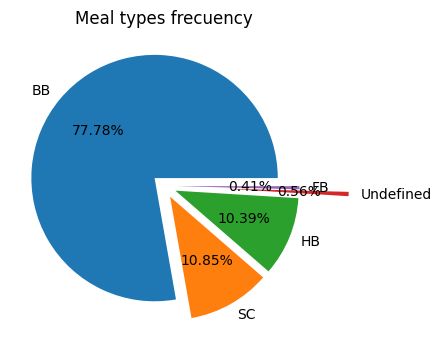

In [52]:
plt.figure(figsize=(6,4))
plt.pie(df.meal.value_counts().values, explode=[0.1, 0.1, 0.1, 0.5, 0.1], labels=df.meal.value_counts().index, autopct='%.2f%%')
plt.title('Meal types frecuency')
plt.show()


### Variable Country over is_canceled

In [53]:
a = df.groupby(['country', 'is_canceled']).adults.count().reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='country', y='adults', color='is_canceled',
       labels={'adults': 'Bookings'}, width=800, height=400)

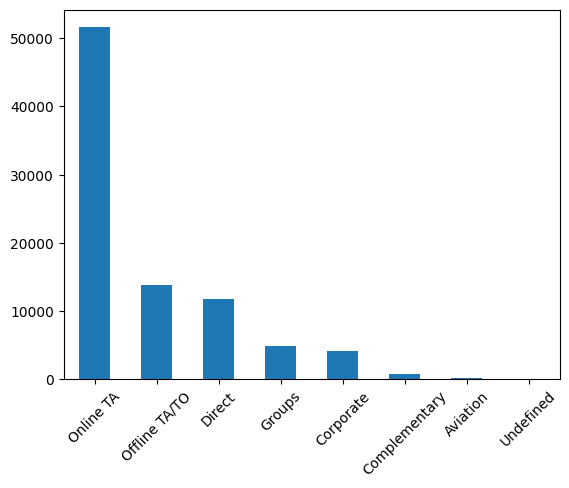

In [54]:
df.market_segment.value_counts().plot(kind='bar')
plt.xticks(rotation=45)
plt.show()

In [55]:
a = df.groupby(['market_segment', 'is_canceled']).adults.count().reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='market_segment', y='adults', color='is_canceled',
       labels={'adults': 'Bookings'}, width=800, height=400)

In [56]:
ct = pd.crosstab(df.market_segment, df.is_canceled, margins=True)
ct['%_cancellation'] = (ct[1]/ct['All'])*100
ct.drop('All', axis=1, inplace=True)
ct.drop('All', axis=0, inplace=True)


In [57]:
px.bar(ct.reset_index(), x='market_segment', y='%_cancellation', width=800, height=400)

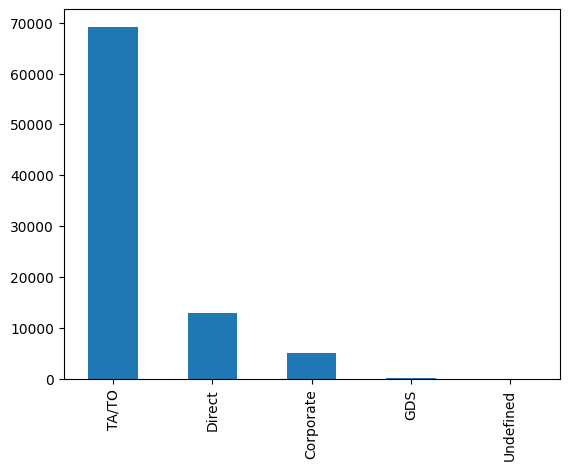

In [58]:
df.distribution_channel.value_counts().plot(kind='bar')
plt.show()

In [59]:
a = df.groupby(['distribution_channel', 'is_canceled']).adults.count().reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='distribution_channel', y='adults', color='is_canceled',
       labels={'adults': 'Bookings'}, width=800, height=400)


In [60]:
ct = pd.crosstab(df.distribution_channel, df.is_canceled, margins=True)
ct['%_cancellation'] = (ct[1]/ct['All'])*100
ct.drop('All', axis=1, inplace=True)
ct.drop('All', axis=0, inplace=True)
px.bar(ct.reset_index(), x='distribution_channel', y='%_cancellation', width=800, height=400)

In [61]:
a = df.groupby(['is_repeated_guest', 'is_canceled']
               ).adults.count().reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='is_repeated_guest', y='adults', color='is_canceled',
       labels={'adults': 'Bookings'}, width=800, height=400)


In [62]:
a = df.groupby(['previous_cancellations', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='previous_cancellations', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})


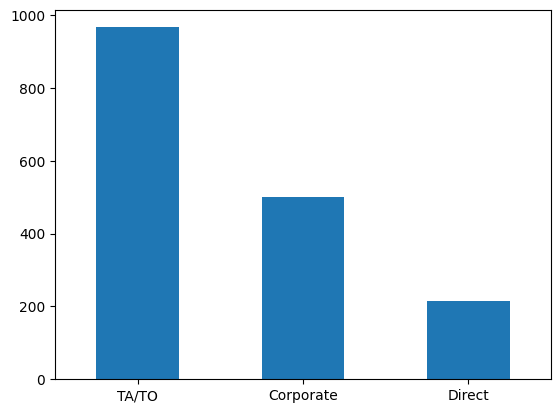

In [63]:
df[df.previous_cancellations>0].distribution_channel.value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.show()

Travel Agents and Tour Operators tend to book rooms before selling service to customers

In [64]:
a = df.groupby(['previous_bookings_not_canceled', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='previous_bookings_not_canceled', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

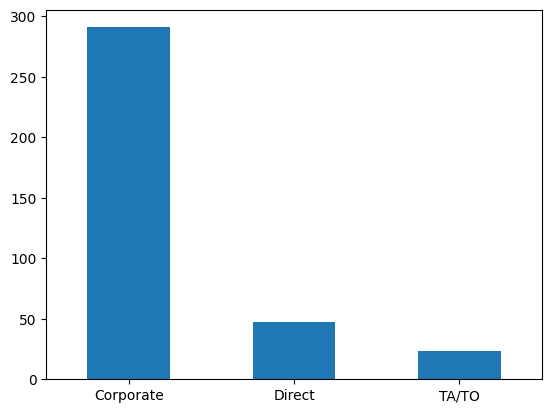

In [65]:
df[df.previous_bookings_not_canceled >10].distribution_channel.value_counts().plot(kind='bar')
plt.xticks(rotation=0)
plt.show()

In [66]:
df.columns

Index(['hotel', 'is_canceled', 'lead_time', 'arrival_date_year',
       'arrival_date_month', 'arrival_date_week_number',
       'arrival_date_day_of_month', 'stays_in_weekend_nights',
       'stays_in_week_nights', 'adults', 'children', 'babies', 'meal',
       'country', 'market_segment', 'distribution_channel',
       'is_repeated_guest', 'previous_cancellations',
       'previous_bookings_not_canceled', 'reserved_room_type',
       'assigned_room_type', 'booking_changes', 'deposit_type', 'agent',
       'company', 'days_in_waiting_list', 'customer_type', 'adr',
       'required_car_parking_spaces', 'total_of_special_requests',
       'reservation_status', 'reservation_status_date'],
      dtype='object')

In [67]:
a = df.groupby(['reserved_room_type', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='reserved_room_type', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

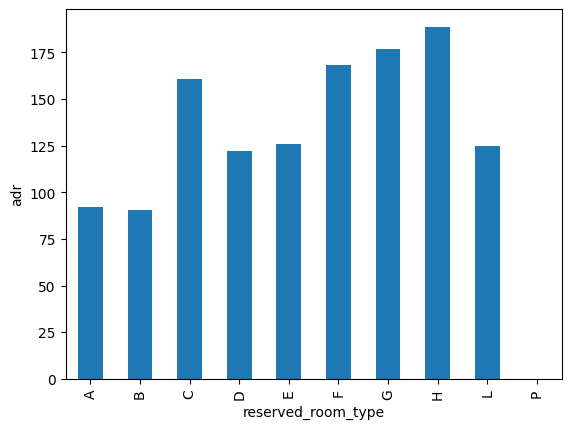

In [68]:
df.groupby('reserved_room_type').adr.mean().plot(kind='bar')
plt.ylabel('adr')
plt.show()

In [69]:
ct = pd.crosstab(df.reserved_room_type, df.is_canceled, margins=True)
ct['%_cancellation'] = (ct[1]/ct['All'])*100
ct.drop('All', axis=1, inplace=True)
ct.drop('All', axis=0, inplace=True)
px.bar(ct.reset_index(), x='reserved_room_type', y='%_cancellation', width=800, height=400)


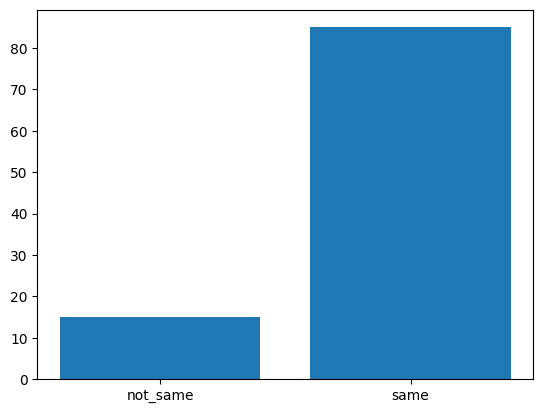

In [70]:
not_same = (df[df.reserved_room_type != df.assigned_room_type].shape[0] / \
    (df[df.reserved_room_type != df.assigned_room_type].shape[0] +
     df[df.reserved_room_type == df.assigned_room_type].shape[0]))*100
same = (df[df.reserved_room_type == df.assigned_room_type].shape[0]/(df[df.reserved_room_type != df.assigned_room_type].shape[0] +
                                                                    df[df.reserved_room_type == df.assigned_room_type].shape[0]))*100
plt.bar(['not_same', 'same'], height=[not_same, same])
plt.show()

In [71]:
a = df.groupby(['booking_changes', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='booking_changes', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})


In [72]:
px.violin(df, y='booking_changes', color='is_canceled', width=800, height=400)

In [73]:
a = df.groupby(['deposit_type', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='deposit_type', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

In [74]:
ct = pd.crosstab(df.deposit_type, df.is_canceled, margins=True)
ct['%_cancellation'] = (ct[1]/ct['All'])*100
ct.drop('All', axis=1, inplace=True)
ct.drop('All', axis=0, inplace=True)
px.bar(ct.reset_index(), x='deposit_type', y='%_cancellation', width=800, height=400)

In [75]:
a = df.groupby(['agent', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='agent', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})


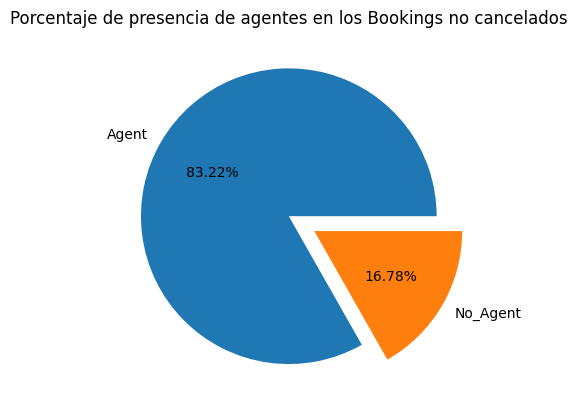

In [76]:
plt.pie(x=df[df.is_canceled == 0].agent.value_counts().values, labels=df[df.is_canceled == 0].agent.value_counts(
).index, explode=[0, 0.2], autopct='%.2f%%')
plt.title('Porcentaje de presencia de agentes en los Bookings no cancelados')
plt.show()

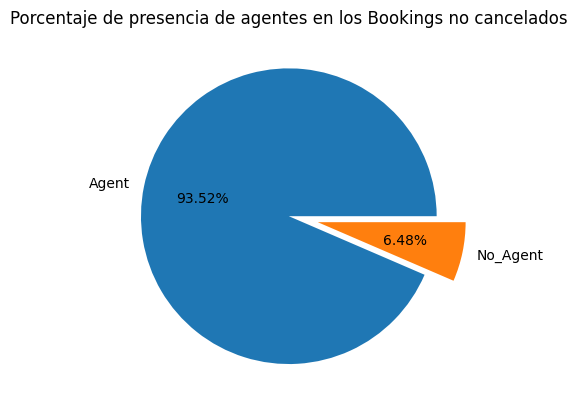

In [77]:
plt.pie(x=df[df.is_canceled == 1].agent.value_counts().values, labels=df[df.is_canceled == 1].agent.value_counts(
).index, explode=[0, 0.2], autopct='%.2f%%')
plt.title('Porcentaje de presencia de agentes en los Bookings no cancelados')
plt.show()


In [78]:
a = df.groupby(['company', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='company', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

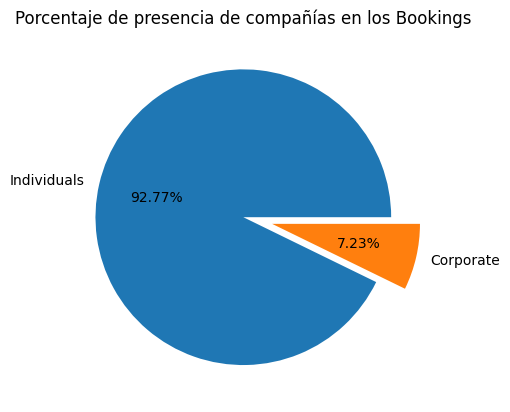

In [79]:
plt.pie(x=df.company.value_counts().values, labels=df.company.value_counts(
).index, explode=[0, 0.2], autopct='%.2f%%')
plt.title('Porcentaje de presencia de compañías en los Bookings')
plt.show()

In [80]:
a = df.groupby(['customer_type', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='customer_type', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})


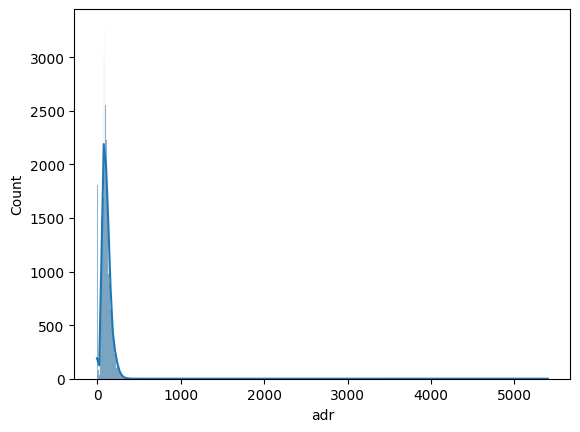

In [81]:
sns.histplot(df, x='adr', kde=True)
plt.show()

In [82]:
px.violin(df, y='adr', color='is_canceled', width=800, height=400)

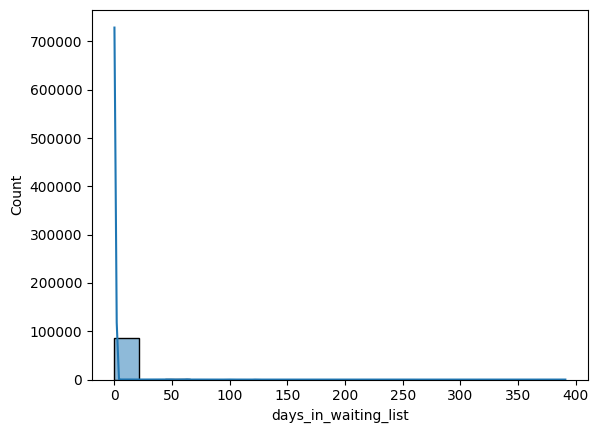

In [83]:
sns.histplot(df, x='days_in_waiting_list', kde=True)
plt.show()

In [84]:
px.violin(df, y='days_in_waiting_list', color='is_canceled', width=800, height=400)

In [85]:
a = df.groupby(['required_car_parking_spaces', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='required_car_parking_spaces', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

In [86]:
px.violin(df, y='required_car_parking_spaces',
          color='is_canceled', width=800, height=400)


In [87]:
a = df.groupby(['total_of_special_requests', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='total_of_special_requests', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})


Cuántos más requisitos especiales se hagan, menos probabilidad de cancelar el booking

In [88]:
px.violin(df, y='total_of_special_requests',
          color='is_canceled', width=800, height=400)

In [89]:
a = df.groupby(['reservation_status', 'is_canceled']).children.count(
).reset_index()
a.is_canceled = a.is_canceled.astype(object)
px.bar(a, x='reservation_status', y='children', color='is_canceled', barmode='relative',
       width=800, height=400, labels={'children': 'Bookings'})

# Statistical Tests ### alpha = 0.05

### Feature Hotel vs is_canceled -> Chi2

H0: Frecuencias esperadas de las muestras iguales (No hay relación)
H1: Frecuencias esperadas de las muestras distintas (Hay relación)

In [90]:
import scipy.stats as stats
alpha = 0.05

In [91]:
def rejection(p):
    if p < alpha: s = "Rechazamos H0 --> Hay diferencias significativas"
    else: s = "No rechazamos H0 --> No hay diferencias significativas"
    return s

In [92]:
def chi2(ct):
    statistic, pvalue, dof, expected = stats.chi2_contingency(ct)
    print(rejection(pvalue)+" entre ",ct.index.name," y ",ct.columns.name)

In [93]:
def ttest(d1, d2):
    pvalue = stats.ttest_ind(d1, d2)[1]
    print(rejection(pvalue)+" entre las medias")

In [94]:
ct = pd.crosstab(df.hotel, df.is_canceled)
ct

is_canceled,0,1
hotel,,
City Hotel,37373,16047
Resort Hotel,25985,7974


In [95]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  hotel  y  is_canceled


### Feature lead_time vs is_canceled -> t student diferencia de medias

H0: No hay diferencia de medias
H1: Si hay diferencia de medias

In [96]:
no_cancel = df[df.is_canceled == 0].lead_time
cancel = df[df.is_canceled == 1].lead_time

In [97]:
ttest(no_cancel, cancel)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature lead_time vs hotel -> t student diferencia de medias

In [98]:
city = df[df.hotel=='City Hotel'].lead_time
resort = df[df.hotel == 'Resort Hotel'].lead_time

In [99]:
ttest(city, resort)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature arrival_date_year vs is_canceled -> Chi2

In [100]:
ct = pd.crosstab(df.arrival_date_year, df.is_canceled)
ct

is_canceled,0,1
arrival_date_year,,
2015,10605,2702
2016,31178,11207
2017,21575,10112


In [101]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  arrival_date_year  y  is_canceled


### Feature arrival_date_month vs is_canceled -> Chi2

In [102]:
ct = pd.crosstab(df.arrival_date_month, df.is_canceled)
ct


is_canceled,0,1
arrival_date_month,,
April,5498,2409
August,7633,3621
December,3751,1378
February,4682,1415
January,3654,1038
July,6858,3198
June,5411,2353
March,5681,1830
May,5912,2442


In [103]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  arrival_date_month  y  is_canceled


### Feature arrival_date_week_number vs is_canceled -> Chi2

In [104]:
ct = pd.crosstab(df.arrival_date_week_number, df.is_canceled)

In [105]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  arrival_date_week_number  y  is_canceled


In [106]:
ttest(df[df.is_canceled==0].arrival_date_week_number, df[df.is_canceled==1].arrival_date_week_number)

No rechazamos H0 --> No hay diferencias significativas entre las medias


### Feature stays_in_weekend_nights vs is_canceled -> t student diferencias de media

In [107]:
ttest(df[df.is_canceled==0].stays_in_weekend_nights, df[df.is_canceled==1].stays_in_weekend_nights)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature stays_in_weekend_nights vs hotel -> t student diferencias de media

In [108]:
ttest(df[df.hotel=='City Hotel'].stays_in_weekend_nights, df[df.hotel=='Resort Hotel'].stays_in_weekend_nights)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature stays_in_week_nights vs is_canceled -> t student diferencias de media

In [109]:
ttest(df[df.is_canceled==0].stays_in_week_nights, df[df.is_canceled==1].stays_in_week_nights)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature stays_in_week_nights vs hotel -> t student diferencias de media

In [110]:
ttest(df[df.hotel=='City Hotel'].stays_in_week_nights, df[df.hotel=='Resort Hotel'].stays_in_week_nights)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature adults vs is_canceled -> t student diferencias de media

In [111]:
ttest(df[df.is_canceled==0].adults, df[df.is_canceled==1].adults)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature adults vs hotel -> t student diferencias de media

In [112]:
ttest(df[df.hotel=='Resort Hotel'].adults, df[df.hotel=='City Hotel'].adults)

No rechazamos H0 --> No hay diferencias significativas entre las medias


### Feature children vs is_canceled -> t student diferencias de media

In [113]:
ttest(df[df.is_canceled==0].children, df[df.is_canceled==1].children)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature children vs hotel -> t student diferencias de media

In [114]:
ttest(df[df.hotel=='Resort Hotel'].children, df[df.hotel=='City Hotel'].children)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature babies vs is_canceled -> t student diferencias de media

In [115]:
ttest(df[df.is_canceled==0].babies, df[df.is_canceled==1].babies)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature babies vs hotel -> t student diferencias de media

In [116]:
ttest(df[df.hotel=='Resort Hotel'].babies, df[df.hotel=='City Hotel'].babies)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature meal vs is_canceled -> Chi2

In [117]:
ct = pd.crosstab(df.meal, df.is_canceled)
ct

is_canceled,0,1
meal,,
BB,49921,18044
FB,260,99
HB,6634,2449
SC,6133,3347
Undefined,410,82


In [118]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  meal  y  is_canceled


### Feature country vs is_canceled -> Chi2

In [119]:
ct = pd.crosstab(df.country, df.is_canceled)
ct

is_canceled,0,1
country,,
africa,559,436
asia,2286,1141
eu,58126,21763
n_am,1531,474
other,106,53
s_am,332,120
unknown,418,34


In [120]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  country  y  is_canceled


### Feature market_segment vs is_canceled -> Chi2

In [121]:
ct = pd.crosstab(df.market_segment, df.is_canceled)
ct

is_canceled,0,1
market_segment,,
Aviation,182,45
Complementary,614,88
Corporate,3698,510
Direct,10067,1737
Groups,3606,1335
Offline TA/TO,11822,2060
Online TA,33369,18244
Undefined,0,2


In [122]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  market_segment  y  is_canceled


### Feature distribution_channel vs is_canceled -> Chi2

In [123]:
ct = pd.crosstab(df.distribution_channel, df.is_canceled)
ct

is_canceled,0,1
distribution_channel,,
Corporate,4429,648
Direct,11063,1925
GDS,145,36
TA/TO,47720,21408
Undefined,1,4


In [124]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  distribution_channel  y  is_canceled


### Feature is_repeated_guest vs is_canceled -> Chi2

In [125]:
ct = pd.crosstab(df.is_repeated_guest, df.is_canceled)
ct

is_canceled,0,1
is_repeated_guest,,
0,60204,23760
1,3154,261


In [126]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  is_repeated_guest  y  is_canceled


### Feature previous_cancellations vs is_canceled -> t student diferencias de media

In [127]:
ttest(df[df.is_canceled==0].previous_cancellations, df[df.is_canceled==1].previous_cancellations)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature previous_cancellations vs hotel -> t student diferencias de media

In [128]:
ttest(df[df.hotel=='Resort Hotel'].previous_cancellations, df[df.hotel=='City Hotel'].previous_cancellations)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature previous_bookings_not_canceled vs is_canceled -> t student diferencias de media

In [129]:
ttest(df[df.is_canceled==0].previous_bookings_not_canceled, df[df.is_canceled==1].previous_bookings_not_canceled)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature previous_bookings_not_canceled vs hotel -> t student diferencias de media

In [130]:
ttest(df[df.hotel=='Resort Hotel'].previous_bookings_not_canceled, df[df.hotel=='City Hotel'].previous_bookings_not_canceled)

No rechazamos H0 --> No hay diferencias significativas entre las medias


### Feature reserved_room_type vs is_canceled -> Chi2

In [131]:
ct = pd.crosstab(df.reserved_room_type, df.is_canceled)
ct

is_canceled,0,1
reserved_room_type,,
A,41852,14684
B,681,318
C,619,296
D,12162,5236
E,4400,1648
F,1972,851
G,1315,737
H,353,243
L,4,2


In [132]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  reserved_room_type  y  is_canceled


### Feature assigned_room_type vs is_canceled -> Chi2

In [133]:
ct = pd.crosstab(df.assigned_room_type, df.is_canceled)
ct

is_canceled,0,1
assigned_room_type,,
A,32121,14179
B,1421,399
C,1770,395
D,16998,5431
E,5497,1697
F,2733,894
G,1745,753
H,457,249
I,352,5


In [134]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  assigned_room_type  y  is_canceled


### Feature booking_changes vs is_canceled -> t student diferencia de medias

In [135]:
ttest(df[df.is_canceled==0].booking_changes, df[df.is_canceled==1].booking_changes)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature booking_changes vs hotel -> t student diferencia de medias

In [136]:
ttest(df[df.hotel=='Resort hotel'].booking_changes, df[df.hotel=='City Hotel'].booking_changes)

No rechazamos H0 --> No hay diferencias significativas entre las medias


### Feature deposit_type vs is_canceled -> Chi2

In [137]:
ct = pd.crosstab(df.deposit_type, df.is_canceled)
ct

is_canceled,0,1
deposit_type,,
No Deposit,63222,23012
Non Refund,55,983
Refundable,81,26


In [138]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  deposit_type  y  is_canceled


In [139]:
df.agent.value_counts()

Agent       75190
No_Agent    12189
Name: agent, dtype: int64

### Feature agent vs is_canceled -> Chi2

In [140]:
ct = pd.crosstab(df.agent, df.is_canceled)
ct

is_canceled,0,1
agent,,
Agent,52726,22464
No_Agent,10632,1557


In [141]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  agent  y  is_canceled


### Feature company vs is_canceled -> Chi2

In [142]:
ct = pd.crosstab(df.company, df.is_canceled)
ct

is_canceled,0,1
company,,
Corporate,5555,763
Individuals,57803,23258


In [143]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  company  y  is_canceled


### Feature days_in_waiting_list vs is_canceled -> t student diferencia de medias

In [144]:
ttest(df[df.is_canceled==0].days_in_waiting_list, df[df.is_canceled==1].days_in_waiting_list)

No rechazamos H0 --> No hay diferencias significativas entre las medias


days_in_waiting_list no es significativo para crear el modelo

### Feature days_in_waiting_list vs hotel -> t student diferencia de medias

In [145]:
ttest(df[df.hotel=='Resort Hotel'].days_in_waiting_list, df[df.hotel=='City Hotel'].days_in_waiting_list)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature customer_type vs is_canceled -> Chi2

In [146]:
ct = pd.crosstab(df.is_canceled, df.customer_type)
ct

customer_type,Contract,Group,Transient,Transient-Party
is_canceled,,,,
0,2627,490,50302,9939
1,512,54,21668,1787


In [147]:
chi2(ct)

Rechazamos H0 --> Hay diferencias significativas entre  is_canceled  y  customer_type


### Feature adr vs is_canceled -> t student diferencia de medias

In [148]:
ttest(df[df.is_canceled==0].adr, df[df.is_canceled==1].adr)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature adr vs hotel -> t student diferencia de medias

In [149]:
ttest(df[df.hotel=='Resort Hotel'].adr, df[df.hotel=='City Hotel'].adr)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature required_car_parking_spaces vs is_canceled -> t student diferencia de medias

In [150]:
ttest(df[df.is_canceled==0].required_car_parking_spaces, df[df.is_canceled==1].required_car_parking_spaces)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature required_car_parking_spaces vs hotel -> t student diferencia de medias

In [151]:
ttest(df[df.hotel=='Resort Hotel'].required_car_parking_spaces, df[df.hotel=='City Hotel'].required_car_parking_spaces)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature total_of_special_requests vs is_canceled -> t student diferencia de medias

In [152]:
ttest(df[df.is_canceled==0].total_of_special_requests, df[df.is_canceled==1].total_of_special_requests)

Rechazamos H0 --> Hay diferencias significativas entre las medias


### Feature total_of_special_requests vs hotel -> t student diferencia de medias

In [153]:
ttest(df[df.hotel=='Resort Hotel'].total_of_special_requests, df[df.hotel=='City Hotel'].total_of_special_requests)

Rechazamos H0 --> Hay diferencias significativas entre las medias


# Resumen Test Estadísticos sobre is_canceled

In [154]:
cat_vars = [i for i in df.columns if df[i].dtype == 'O' and i != 'reservation_status_date'] + ['arrival_date_week_number', 'arrival_date_day_of_month', 'is_repeated_guest']

In [155]:
def chi2_sig_table(cat, data):
    p_lst = []
    significance = []
    for i in cat:
        ct = pd.crosstab(data.is_canceled, data[i])
        st, pvalue, dof, exp = stats.chi2_contingency(ct)
        p_lst.append(pvalue)
        if pvalue < alpha: significance.append('Significant')
        else: significance.append('Not significant')
    return pd.DataFrame({'Feature':cat, 'p_value':p_lst, 'Significance':significance})

In [156]:
cat_sig_df = chi2_sig_table(cat_vars, df)
cat_sig_df

,Feature,p_value,Significance
0,hotel,2.383624e-99,Significant
1,arrival_date_year,3.820853e-148,Significant
2,arrival_date_month,3.527157e-130,Significant
3,meal,1.117660e-74,Significant
4,country,3.478783e-62,Significant
5,market_segment,0.000000e+00,Significant
6,distribution_channel,0.000000e+00,Significant
7,reserved_room_type,1.277798e-58,Significant
8,assigned_room_type,4.154935e-161,Significant
9,deposit_type,0.000000e+00,Significant


In [157]:
num_vars = [i for i in df.columns if i not in cat_vars and i != 'is_canceled' and i != 'reservation_status_date']

In [158]:
def ttest_sig_table(num, data):
    p_lst = []
    significance = []
    for i in num:
        pvalue = stats.ttest_ind(data[data.is_canceled==0][i], data[data.is_canceled==1][i])[1]
        p_lst.append(pvalue)
        if pvalue < alpha: significance.append('Significant')
        else: significance.append('Not significant')
    return pd.DataFrame({'Feature':num, 'p_value':p_lst, 'Significance':significance})

In [159]:
num_sig_df = ttest_sig_table(num_vars, df)
num_sig_df.sort_values(by='p_value', ascending=True)

,Feature,p_value,Significance
0,lead_time,0.000000e+00,Significant
10,adr,0.000000e+00,Significant
11,required_car_parking_spaces,0.000000e+00,Significant
12,total_of_special_requests,3.356152e-280,Significant
8,booking_changes,2.081605e-169,Significant
2,stays_in_week_nights,3.899658e-133,Significant
3,adults,1.751635e-129,Significant
4,children,1.942432e-88,Significant
1,stays_in_weekend_nights,5.050788e-71,Significant
7,previous_bookings_not_canceled,1.048033e-53,Significant


# Feature Selection 

reservation_status and reservation_status_date son variables que dan información una vez ya se ha cancelado, por lo tanto no dan valor al modelo. days_in_waiting_list no tiene una relación significante con is_canceled

In [160]:
drop = ['reservation_status_date', 'days_in_waiting_list', 'reservation_status']
df.drop(drop, axis=1, inplace=True)

### New Feature Total stays

In [161]:
df['total_stays'] = df.stays_in_week_nights + df.stays_in_weekend_nights
df.drop(['stays_in_week_nights', 'stays_in_weekend_nights',
        'arrival_date_month', 'arrival_date_week_number', 'arrival_date_day_of_month'], axis=1, inplace=True)


In [162]:
df_mod = df.loc[(df.adults >= 1) & (df.total_stays>=1)]

In [163]:
cat_vars = [i for i in df.columns if df[i].dtype == 'O' ]

# Preprocessing

### OneHotEncoding categorical variables

In [164]:
from sklearn.preprocessing import OneHotEncoder
ohe = OneHotEncoder(sparse=False)
ohe.fit(df_mod[cat_vars])
df_mod[ohe.get_feature_names_out()] = ohe.transform(df_mod[cat_vars])
df_mod.drop(cat_vars, axis=1, inplace=True)

C:\Users\richi\AppData\Local\Temp\ipykernel_2708\3917526866.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\richi\AppData\Local\Temp\ipykernel_2708\3917526866.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\richi\AppData\Local\Temp\ipykernel_2708\3917526866.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-d

In [165]:
cat_sig_df = chi2_sig_table(ohe.get_feature_names_out(), df_mod)

In [166]:
cat_sig_df[cat_sig_df.Significance == 'Not significant']

,Feature,p_value,Significance
6,meal_FB,1.000000,Not significant
7,meal_HB,0.235164,Not significant
14,country_other,0.130700,Not significant
15,country_s_am,0.546323,Not significant
21,market_segment_Groups,0.480036,Not significant
24,market_segment_Undefined,0.134501,Not significant
31,reserved_room_type_B,0.107825,Not significant
34,reserved_room_type_E,0.660458,Not significant
38,reserved_room_type_L,1.000000,Not significant
49,assigned_room_type_L,0.617524,Not significant


In [167]:
drop_not_sign_cat_feat = cat_sig_df[cat_sig_df.Significance == 'Not significant'].Feature

In [168]:
num_vars = [i for i in df_mod.columns if i not in ohe.get_feature_names_out() and i != 'is_canceled']

In [169]:
num_sig_df = ttest_sig_table(num_vars, df_mod)

In [170]:
num_sig_df

,Feature,p_value,Significance
0,lead_time,0.000000e+00,Significant
1,adults,3.892844e-130,Significant
2,children,4.041580e-85,Significant
3,babies,5.187290e-10,Significant
4,is_repeated_guest,2.767072e-136,Significant
5,previous_cancellations,1.221604e-51,Significant
6,previous_bookings_not_canceled,1.219247e-53,Significant
7,booking_changes,5.125519e-167,Significant
8,adr,1.830834e-285,Significant
9,required_car_parking_spaces,0.000000e+00,Significant


In [171]:
df_mod.drop(drop_not_sign_cat_feat, axis=1, inplace=True)

C:\Users\richi\AppData\Local\Temp\ipykernel_2708\4111385701.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [172]:
X = df_mod.drop('is_canceled', axis=1, inplace=False)
Y = df_mod.is_canceled

### Standardize features

In [173]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
norm_X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

### Splitting dataset

In [174]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(norm_X, Y, test_size=0.25, stratify=Y, random_state=42)

# Feature Importance

#### Metrics functions

In [175]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
def metrics(true, pred):
    cm = confusion_matrix(true, pred)
    plt.rcParams["axes.grid"] = False
    plt.figure(figsize=(5,5))
    ConfusionMatrixDisplay(cm).plot()
    plt.show()
    print(classification_report(true, pred))
    plt.close()

def roc(true, pred):
    fpr, tpr, _ = roc_curve(true, pred)
    auc = roc_auc_score(true, pred)
    sns.set_style('darkgrid')
    sns.lineplot(x=fpr, y=tpr, label="AUC: "+str(auc))
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend()
    plt.show()
    plt.close()

### Logistic Regression

In [176]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(max_iter=1000)
model.fit(X_train, Y_train)
importances = pd.DataFrame({'Features':X_train.columns, 'Coef':model.coef_[0]}).sort_values(by='Coef', ascending=False).reset_index(drop=True)

<Figure size 500x500 with 0 Axes>

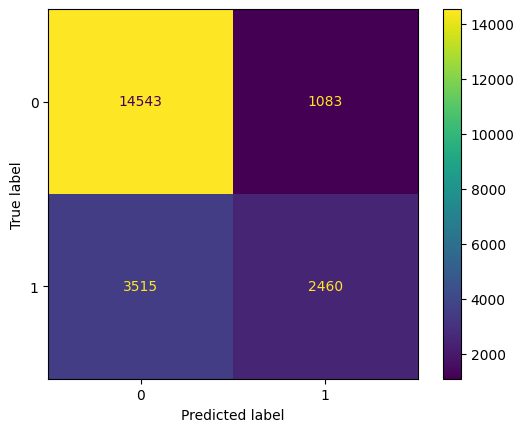

              precision    recall  f1-score   support

           0       0.81      0.93      0.86     15626
           1       0.69      0.41      0.52      5975

    accuracy                           0.79     21601
   macro avg       0.75      0.67      0.69     21601
weighted avg       0.77      0.79      0.77     21601



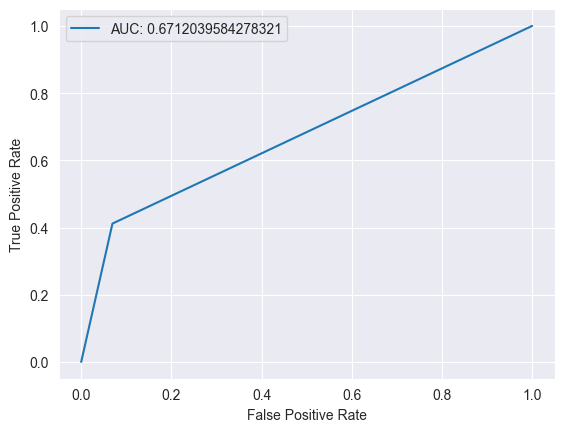

In [177]:
pred = model.predict(X_test)
metrics(Y_test, pred)
roc(Y_test, pred)

In [178]:
px.bar(importances, x='Features', y='Coef', width=800, height=400)

In [179]:
importances[importances.Coef.abs()>=0.2]

,Features,Coef
0,previous_cancellations,0.674416
1,assigned_room_type_A,0.476540
2,lead_time,0.407041
3,deposit_type_Non Refund,0.340116
4,market_segment_Online TA,0.308479
5,adr,0.245934
54,booking_changes,-0.206610
55,assigned_room_type_F,-0.252914
56,market_segment_Offline TA/TO,-0.313266
57,assigned_room_type_G,-0.357325


In [180]:
red_norm_X = norm_X.loc[:, importances[importances.Coef.abs()>=0.2].Features]
red_X = norm_X.loc[:, importances[importances.Coef.abs() >= 0.2].Features]
red_norm_X

,previous_cancellations,assigned_room_type_A,lead_time,deposit_type_Non Refund,market_segment_Online TA,adr,booking_changes,assigned_room_type_F,market_segment_Offline TA/TO,assigned_room_type_G,previous_bookings_not_canceled,total_of_special_requests,reserved_room_type_A,required_car_parking_spaces
0,-0.082543,-1.068012,-0.850772,-0.11027,-1.203022,-0.594205,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,-0.840329,0.737105,-0.300467
1,-0.082543,0.936319,-0.781024,-0.11027,-1.203022,-0.594205,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,-0.840329,0.737105,-0.300467
2,-0.082543,0.936319,-0.769399,-0.11027,0.831240,-0.171322,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,0.361096,0.737105,-0.300467
3,-0.082543,-1.068012,-0.932145,-0.11027,-1.203022,-0.005846,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,-0.840329,-1.356658,-0.300467
4,-0.082543,-1.068012,-0.827523,-0.11027,-1.203022,-0.079391,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,0.361096,-1.356658,-0.300467
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
86398,-0.082543,0.936319,-0.664777,-0.11027,-1.203022,-0.205520,-0.377602,-0.208631,2.299758,-0.171904,-0.106297,-0.840329,0.737105,-0.300467
86399,-0.082543,-1.068012,0.253575,-0.11027,0.831240,2.171634,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,1.562521,-1.356658,-0.300467
86400,-0.082543,-1.068012,-0.536905,-0.11027,0.831240,0.926519,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,3.965371,-1.356658,-0.300467
86401,-0.082543,0.936319,0.334948,-0.11027,0.831240,-0.053650,-0.377602,-0.208631,-0.434828,-0.171904,-0.106297,-0.840329,0.737105,-0.300467


### Tree-Based Model - XGBClassifier

### PCA

In [181]:
def biplot(pc1, pc2, points, coeff, labels):
    xs = points[:,pc1]
    ys = points[:,pc2]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.figure(figsize=(10,8))
    plt.scatter(xs*scalex, ys*scaley)
    for i in range(coeff.shape[0]):
        plt.arrow(0, 0, coeff[i,pc1], coeff[i,pc2], color='r')
        plt.text(coeff[i,pc1]* 1.15, coeff[i,pc2] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')

In [182]:
from sklearn.decomposition import PCA
pca = PCA()
result = pca.fit_transform(red_norm_X)

<BarContainer object of 14 artists>

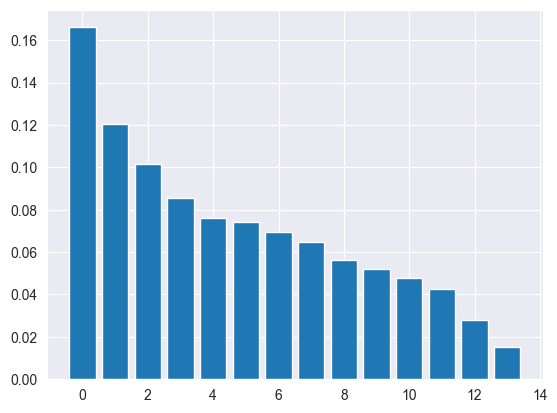

In [183]:
plt.bar(x=np.arange(0, pca.n_components_),height=pca.explained_variance_ratio_)
plt.show()

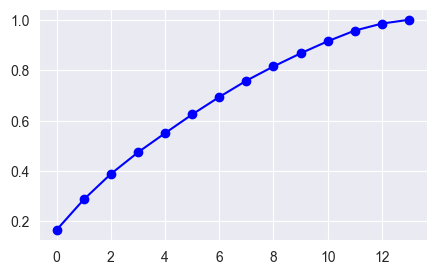

In [184]:
plt.figure(figsize=(5, 3))
plt.plot(pca.explained_variance_ratio_.cumsum(), 'o-b')
plt.show()

In [185]:
pca = PCA(n_components=0.8)
X_pca = pca.fit_transform(red_norm_X)

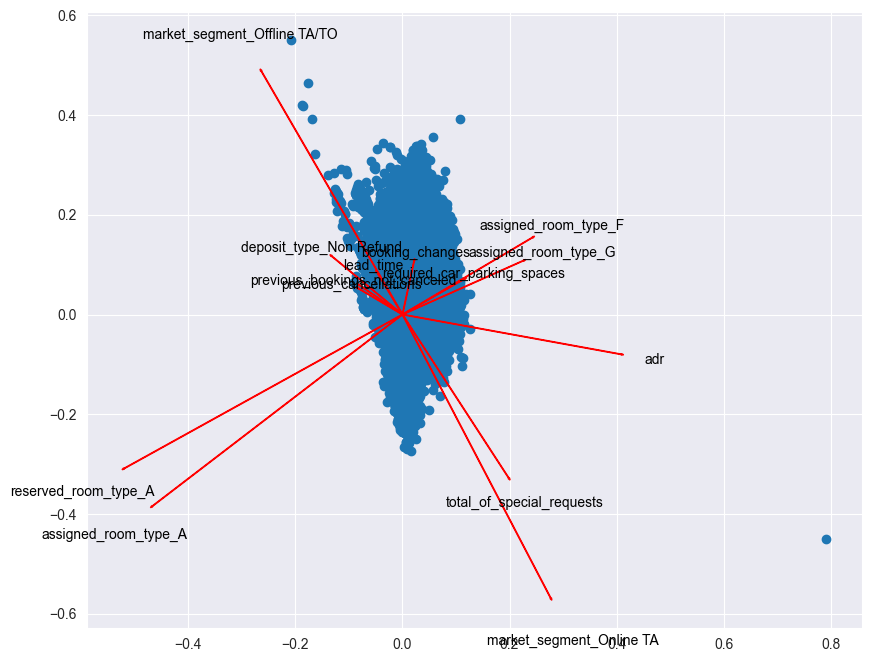

In [186]:
biplot(0, 1, X_pca, pca.components_.T, red_norm_X.columns)

### Pipeline implementation

In [187]:
from sklearn.pipeline import Pipeline
_sc = StandardScaler()
_pca = PCA(n_components=0.85)
_model = LogisticRegression(max_iter=1000)

log_regress_model = Pipeline([('std_scaler', _sc), ('pca', _pca), ('regressor', _model)])

In [188]:
X_train, X_test, Y_train, Y_test = train_test_split(red_X, Y, test_size=0.3, shuffle=True, random_state=42)
log_regress_model.fit(X_train, Y_train)

Pipeline(steps=[('std_scaler', StandardScaler()),
                ('pca', PCA(n_components=0.85)),
                ('regressor', LogisticRegression(max_iter=1000))])

<Figure size 500x500 with 0 Axes>

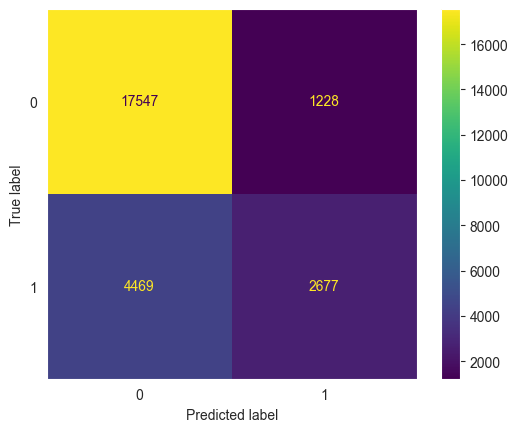

              precision    recall  f1-score   support

           0       0.80      0.93      0.86     18775
           1       0.69      0.37      0.48      7146

    accuracy                           0.78     25921
   macro avg       0.74      0.65      0.67     25921
weighted avg       0.77      0.78      0.76     25921



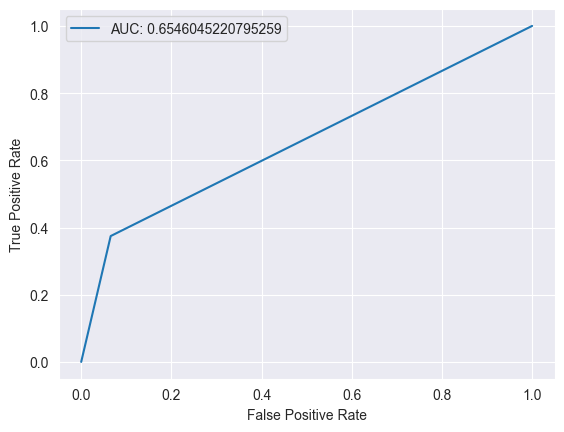

In [189]:
pred = log_regress_model.predict(X_test)
metrics(Y_test, pred)
roc(Y_test, pred)

### FA

*Bartlett's test of sphericity*

Bartlett’s test checks whether the correlation is present in the given data. It tests the null hypothesis (H0) that correlation matrix is an Identical matrix. Identical matrix consists all the diagonal elements as 1. So, the null hypothesis assumes that no correlation is present among the variables. We want to reject this null hypothesis because factor analysis aims at explaining the common variance i.e. the variation due to correlation among the variables. If the p test statistic value is less than 0.05, we can decide that the correlation is not an Identical matrix i.e. correlation is present among the variables with 95% confidence level.

In [190]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
_, p_value = calculate_bartlett_sphericity(red_norm_X)
if p_value < 0.05: print(p_value," Reject H0: Correlation Matrix is significantly not identical")

0.0  Reject H0: Correlation Matrix is significantly not identical


*Kaiser-Meyer-Olkin (KMO) test.*

KMO Test measures the proportion of variance that might be common variance among the variables. Larger proportions are expected as it represents more correlation is present among the variables there by giving way for application of dimensionality reduction techniques such as Factor Analysis. KMO score is always between 0 to 1 and values more than 0.6 are much appreciated. We can also say it as a measure of how suited our data is for factor analysis.

In [191]:
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_vars, kmo_model = calculate_kmo(red_norm_X)
kmo_vars = pd.DataFrame({'kmo':kmo_vars}, index=red_norm_X.columns)
kmo_vars

,kmo
previous_cancellations,0.511591
assigned_room_type_A,0.557425
lead_time,0.411749
deposit_type_Non Refund,0.504969
market_segment_Online TA,0.535650
adr,0.737659
booking_changes,0.309205
assigned_room_type_F,0.753992
market_segment_Offline TA/TO,0.545056
assigned_room_type_G,0.720498


In [192]:
kmo_model

0.5710190274929381

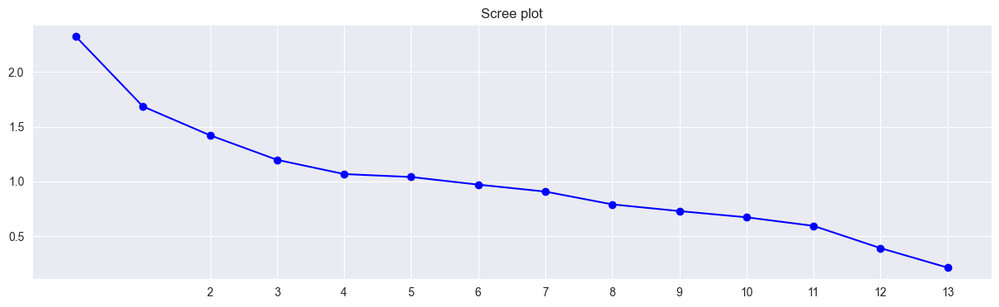

In [193]:
from factor_analyzer import FactorAnalyzer
fa = FactorAnalyzer(rotation='varimax')
fa.fit(red_norm_X)
ev, v = fa.get_eigenvalues()
plt.figure(figsize=(15,4))
plt.plot(ev, 'o-b')
plt.xticks(np.arange(min(range(2, red_norm_X.shape[1])), max(range(2, red_norm_X.shape[1]))+1, 1))
plt.title('Scree plot')
plt.show()

In [194]:
n_factors = np.where(ev == min([i for i in ev if i>=1 and i<2]))[0][0]

In [195]:
fa = FactorAnalyzer(n_factors=4, rotation='varimax')
X_pca = fa.fit_transform(red_norm_X)

In [196]:
X_pca = pd.DataFrame(X_pca)
X_pca

,0,1,2,3
0,0.243321,-1.202023,-0.781246,-0.008618
1,0.679266,-1.071797,-0.703060,-0.015570
2,0.813771,0.706046,-0.837476,-0.111073
3,-1.330314,-1.152246,-0.788194,-0.029154
4,-1.338645,-1.086055,-0.697026,-0.003213
...,...,...,...,...
86398,0.722247,-1.343220,-0.619963,-0.163446
86399,-1.256530,0.880698,0.240109,-0.134347
86400,-1.252649,0.874193,-0.578261,-0.060421
86401,0.857008,0.728586,0.279490,-0.140001


In [197]:
loadings = pd.DataFrame(fa.loadings_, index=red_norm_X.columns)
loadings

,0,1,2,3
previous_cancellations,0.022055,0.000753,0.045410,0.496824
assigned_room_type_A,0.813480,0.049021,0.021109,0.019004
lead_time,0.028077,0.053908,0.994437,-0.058807
deposit_type_Non Refund,0.076400,-0.097056,0.171573,0.048208
market_segment_Online TA,-0.001009,0.907901,-0.061602,-0.119893
adr,-0.347912,0.298706,0.007274,-0.093350
booking_changes,-0.046860,-0.049159,0.064601,0.011545
assigned_room_type_F,-0.266420,0.029326,-0.025131,-0.004496
market_segment_Offline TA/TO,0.056469,-0.565208,0.154689,-0.050245
assigned_room_type_G,-0.230823,0.053757,-0.005520,-0.006555


In [198]:
variance = pd.DataFrame(fa.get_factor_variance(), index=['variance', 'variance rate', 'cum_variance'])

In [199]:
variance

,0,1,2,3
variance,1.803049,1.369201,1.065125,0.909272
variance rate,0.128789,0.097800,0.076080,0.064948
cum_variance,0.128789,0.226589,0.302670,0.367618


In [200]:
loadings[loadings[0].abs()>0.1][0].abs().sort_values(ascending=False)

reserved_room_type_A           0.929675
assigned_room_type_A           0.813480
adr                            0.347912
assigned_room_type_F           0.266420
assigned_room_type_G           0.230823
required_car_parking_spaces    0.121180
Name: 0, dtype: float64

In [201]:
idx_2 = loadings.T.abs().idxmax().reset_index()
idx_2.columns = ['feature', 'factor']
idx_2

,feature,factor
0,previous_cancellations,3
1,assigned_room_type_A,0
2,lead_time,2
3,deposit_type_Non Refund,2
4,market_segment_Online TA,1
5,adr,0
6,booking_changes,2
7,assigned_room_type_F,0
8,market_segment_Offline TA/TO,1
9,assigned_room_type_G,0


In [202]:
idx = loadings.T.abs().idxmax().reset_index()
idx.columns = ['feature', 'factor']
factors = {}
for i in range(loadings.shape[1]):
    factors['fact_'+str(i)] = list(idx_2[idx_2.factor == i].feature)
factors

{'fact_0': ['assigned_room_type_A',
  'adr',
  'assigned_room_type_F',
  'assigned_room_type_G',
  'reserved_room_type_A',
  'required_car_parking_spaces'],
 'fact_1': ['market_segment_Online TA',
  'market_segment_Offline TA/TO',
  'total_of_special_requests'],
 'fact_2': ['lead_time', 'deposit_type_Non Refund', 'booking_changes'],
 'fact_3': ['previous_cancellations', 'previous_bookings_not_canceled']}

In [203]:
communalities = pd.DataFrame({'communalities':fa.get_communalities()}, index=red_norm_X.columns)

In [204]:
communalities.sort_values(by='communalities', ascending=False)

,communalities
lead_time,0.996057
reserved_room_type_A,0.875014
market_segment_Online TA,0.842454
assigned_room_type_A,0.664960
previous_bookings_not_canceled,0.627143
market_segment_Offline TA/TO,0.349103
previous_cancellations,0.249384
adr,0.219035
total_of_special_requests,0.114222
assigned_room_type_F,0.072492


sacar las variables con mayores coeficientes para cada componente
sacar las componentes y hacer cluster con ellas